# Carparts Segmentation using Ultralytics YOLO11

This notebook serves as a starting point for training the YOLO11 model on [carparts](https://docs.ultralytics.com/datasets/segment/carparts-seg/) segmentation dataset.

## Dataset Structure

The data distribution within the Carparts Segmentation Dataset is organized as outlined below:

- **Training set**: Includes 3156 images, each accompanied by its corresponding annotations.
- **Testing set**: Comprises 276 images, with each one paired with its respective annotations.
- **Validation set**: Consists of 401 images, each having corresponding annotations.

## Setup

pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

[![PyPI - Version](https://img.shields.io/pypi/v/ultralytics?logo=pypi&logoColor=white)](https://pypi.org/project/ultralytics/) [![Downloads](https://static.pepy.tech/badge/ultralytics)](https://clickpy.clickhouse.com/dashboard/ultralytics) [![PyPI - Python Version](https://img.shields.io/pypi/pyversions/ultralytics?logo=python&logoColor=gold)](https://pypi.org/project/ultralytics/)

In [22]:
!pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.226 🚀 Python-3.10.14 torch-2.3.0 CUDA:0 (NVIDIA A40, 45488MiB)
Setup complete ✅ (64 CPUs, 368.8 GB RAM, 0.0/0.1 GB disk)


## Train

Train YOLO11 on [Detect](https://docs.ultralytics.com/tasks/detect/), [Segment](https://docs.ultralytics.com/tasks/segment/), [Classify](https://docs.ultralytics.com/tasks/classify/) and [Pose](https://docs.ultralytics.com/tasks/pose/) datasets. See [YOLO11 Train Docs](https://docs.ultralytics.com/modes/train/) for more information.

In [23]:
from ultralytics import YOLO
import torch

# Clear cache to avoid conflicts
torch.cuda.empty_cache()

model = YOLO("yolo11n-seg.pt")



In [24]:

results = model.train(
    data="carparts-seg.yaml",
    epochs=10,
    imgsz=640,
    batch=8,
    
    workers=4,         
    device=0,        
    patience=50,   
    pretrained=True,
    verbose=True,     

    exist_ok=True,
    project="runs/segment",
    name="train_yolo11_fast",
    save=True,
    save_period=5,
    plots=True,
    

    amp=True,            
    cache=False,          
    single_cls=False,
    rect=False,
    cos_lr=False,
)



New https://pypi.org/project/ultralytics/8.3.229 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.226 🚀 Python-3.10.14 torch-2.3.0 CUDA:0 (NVIDIA A40, 45488MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=carparts-seg.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_yolo11_fast, nbs=64, nms=False, opset=None, op

In [25]:
import os
best_pt = os.path.join(results.save_dir, "weights", "best.pt")
last_pt = os.path.join(results.save_dir, "weights", "last.pt")

print("\nTraining finished!")
print(f"Best model (highest mAP): {best_pt}")
print(f"Last checkpoint:          {last_pt}")
print(f"Results folder:           {results.save_dir}")


Training finished!
Best model (highest mAP): /nvme/mvnshpra/apptainer_env/runs/segment/train_yolo11_fast/weights/best.pt
Last checkpoint:          /nvme/mvnshpra/apptainer_env/runs/segment/train_yolo11_fast/weights/last.pt
Results folder:           /nvme/mvnshpra/apptainer_env/runs/segment/train_yolo11_fast


![Dataset sample image](https://github.com/ultralytics/docs/releases/download/0/dataset-sample-image.avif)

## Predict

YOLO11 may be used directly in the Command Line Interface (CLI) with a yolo command for a variety of tasks and modes and accepts additional arguments, i.e. imgsz=640. See a full list of available [yolo arguments](https://docs.ultralytics.com/usage/cfg/) and other details in the [YOLO11 Predict Docs](https://docs.ultralytics.com/modes/train/).

In [26]:
from ultralytics import YOLO

# Load a model
modelp = YOLO(f"{model.trainer.save_dir}/weights/best.pt")  # load a fine-tuned model

# Inference using the model (img/video/stream)
prediction_results = modelp.predict("https://github.com/ultralytics/assets/releases/download/v0.0.0/carparts-image.jpg", save=True)


Found https://github.com/ultralytics/assets/releases/download/v0.0.0/carparts-image.jpg locally at carparts-image.jpg
image 1/1 /nvme/mvnshpra/apptainer_env/carparts-image.jpg: 384x640 1 front_bumper, 1 front_glass, 1 front_left_door, 1 front_right_light, 1 hood, 4 wheels, 170.8ms
Speed: 1.6ms preprocess, 170.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /nvme/mvnshpra/apptainer_env/runs/segment/predict3


&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
<img align="left" src="https://github.com/user-attachments/assets/436ded05-9203-4bb7-883b-f7a1f9a399c1" width="600">

In [27]:
from ultralytics import YOLO

# Load a model - use direct path when skipping training
modele = YOLO("runs/segment/train_yolo11_fast/weights/best.pt")

# Export the model
modele.export(format="onnx")

Ultralytics 8.3.226 🚀 Python-3.10.14 torch-2.3.0 CPU (AMD EPYC-Rome Processor)
YOLO11n-seg summary (fused): 113 layers, 2,839,053 parameters, 0 gradients, 9.6 GFLOPs

PyTorch: starting from 'runs/segment/train_yolo11_fast/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 59, 8400), (1, 32, 160, 160)) (5.7 MB)

ONNX: starting export with onnx 1.19.1 opset 17...
ONNX: slimming with onnxslim 0.1.74...
ONNX: export success ✅ 1.5s, saved as 'runs/segment/train_yolo11_fast/weights/best.onnx' (11.1 MB)

Export complete (1.8s)
Results saved to /nvme/mvnshpra/apptainer_env/runs/segment/train_yolo11_fast/weights
Predict:         yolo predict task=segment model=runs/segment/train_yolo11_fast/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=runs/segment/train_yolo11_fast/weights/best.onnx imgsz=640 data=/home/mvnshpra/.local/lib/python3.10/site-packages/ultralytics/cfg/datasets/carparts-seg.yaml  
Visualize:       https://netron.app


'runs/segment/train_yolo11_fast/weights/best.onnx'

In [28]:
# CELL NEW 1: Setup paths for comparison
from pathlib import Path
import random

BASE_DIR = Path.cwd()
CLEAN_DATASET = BASE_DIR / "datasets/carparts-seg/images"
PATCHED_DATASET = BASE_DIR / "outputs/patched_dataset"
MODEL_PATH = BASE_DIR / "runs/segment/train_yolo11_fast/weights/best.pt"

print(f"✅ Clean dataset: {CLEAN_DATASET.exists()}")
print(f"✅ Patched dataset: {PATCHED_DATASET.exists()}")
print(f"✅ Model: {MODEL_PATH.exists()}")

✅ Clean dataset: True
✅ Patched dataset: True
✅ Model: True


In [29]:
# CELL NEW 2: Find matching images between clean and patched
import os
import time

# Reset random seed based on current time to get different images each run
random.seed(int(time.time()))

# Get all patched image filenames
patched_files = {f.name for f in PATCHED_DATASET.glob("*.jpg")}
print(f"Found {len(patched_files)} patched images")

# Find matching files in clean dataset (across train/val/test)
matching_images = []
for split in ['train', 'val', 'test']:
    split_dir = CLEAN_DATASET / split
    if split_dir.exists():
        for img in split_dir.glob("*.jpg"):
            if img.name in patched_files:
                matching_images.append({
                    'name': img.name,
                    'clean_path': img,
                    'patched_path': PATCHED_DATASET / img.name
                })

print(f"✅ Found {len(matching_images)} matching image pairs")

# Pick 5 random pairs for comparison (DIFFERENT EACH RUN!)
comparison_pairs = random.sample(matching_images, min(5, len(matching_images)))
print(f"Selected {len(comparison_pairs)} pairs for comparison")
for pair in comparison_pairs:
    print(f"  - {pair['name']}")

Found 879 patched images
✅ Found 879 matching image pairs
Selected 5 pairs for comparison
  - te16_jpg.rf.efdcd8e1bbb4fae0eec8cd39b9b75838.jpg
  - train95_jpg.rf.541241e9955e40cf49f09b76dca4584a.jpg
  - train350_jpg.rf.65c14869a6531e0f64ba0ac6e56c31b2.jpg
  - train295_jpg.rf.c00496cf0cdb26877728cab185742006.jpg
  - train104_jpg.rf.cc08b22413d665617da6d54f3d76102b.jpg


In [30]:
# CELL NEW 3: Load YOLO11 model and run segmentation on both clean and patched
from ultralytics import YOLO
import cv2
import numpy as np

# Load trained model
model = YOLO(str(MODEL_PATH))
print("✅ Model loaded")

# Run segmentation on all comparison pairs
results_data = []

for pair in comparison_pairs:
    print(f"\n🔍 Processing: {pair['name']}")
    
    # Segment clean image
    clean_result = model.predict(
        source=str(pair['clean_path']),
        conf=0.25,
        iou=0.45,
        verbose=False,
        save=False
    )[0]
    
    # Segment patched image
    patched_result = model.predict(
        source=str(pair['patched_path']),
        conf=0.25,
        iou=0.45,
        verbose=False,
        save=False
    )[0]
    
    # Store results
    results_data.append({
        'name': pair['name'],
        'clean_img': cv2.cvtColor(cv2.imread(str(pair['clean_path'])), cv2.COLOR_BGR2RGB),
        'patched_img': cv2.cvtColor(cv2.imread(str(pair['patched_path'])), cv2.COLOR_BGR2RGB),
        'clean_seg': cv2.cvtColor(clean_result.plot(), cv2.COLOR_BGR2RGB),
        'patched_seg': cv2.cvtColor(patched_result.plot(), cv2.COLOR_BGR2RGB),
        'clean_masks': len(clean_result.masks.data) if clean_result.masks is not None else 0,
        'patched_masks': len(patched_result.masks.data) if patched_result.masks is not None else 0
    })
    
    print(f"  Clean: {results_data[-1]['clean_masks']} objects detected")
    print(f"  Patched: {results_data[-1]['patched_masks']} objects detected")

print("\n✅ All segmentations complete!")

✅ Model loaded

🔍 Processing: te16_jpg.rf.efdcd8e1bbb4fae0eec8cd39b9b75838.jpg
  Clean: 14 objects detected
  Patched: 12 objects detected

🔍 Processing: train95_jpg.rf.541241e9955e40cf49f09b76dca4584a.jpg
  Clean: 8 objects detected
  Patched: 9 objects detected

🔍 Processing: train350_jpg.rf.65c14869a6531e0f64ba0ac6e56c31b2.jpg
  Clean: 9 objects detected
  Patched: 9 objects detected

🔍 Processing: train295_jpg.rf.c00496cf0cdb26877728cab185742006.jpg
  Clean: 5 objects detected
  Patched: 6 objects detected

🔍 Processing: train104_jpg.rf.cc08b22413d665617da6d54f3d76102b.jpg
  Clean: 6 objects detected
  Patched: 6 objects detected

✅ All segmentations complete!


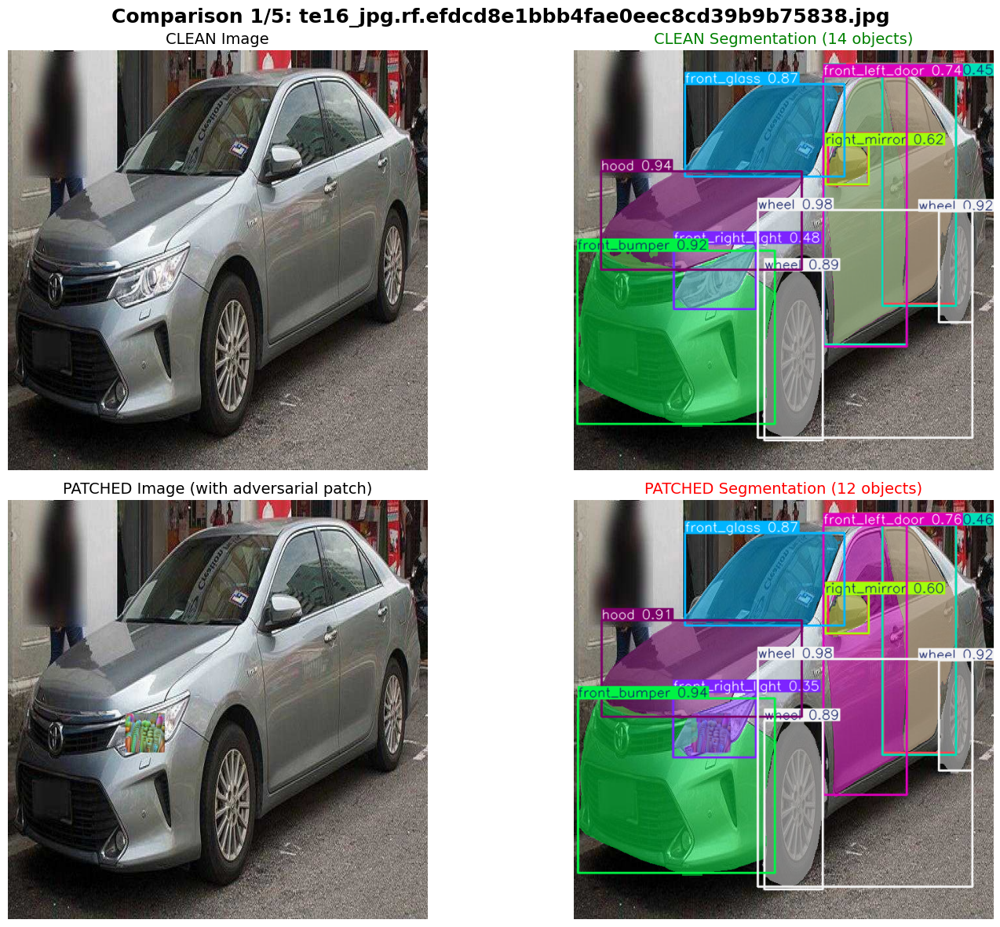


Image: te16_jpg.rf.efdcd8e1bbb4fae0eec8cd39b9b75838.jpg
  Clean detected:   14 objects
  Patched detected: 12 objects
  Difference:       2 (patch reduced detections!)



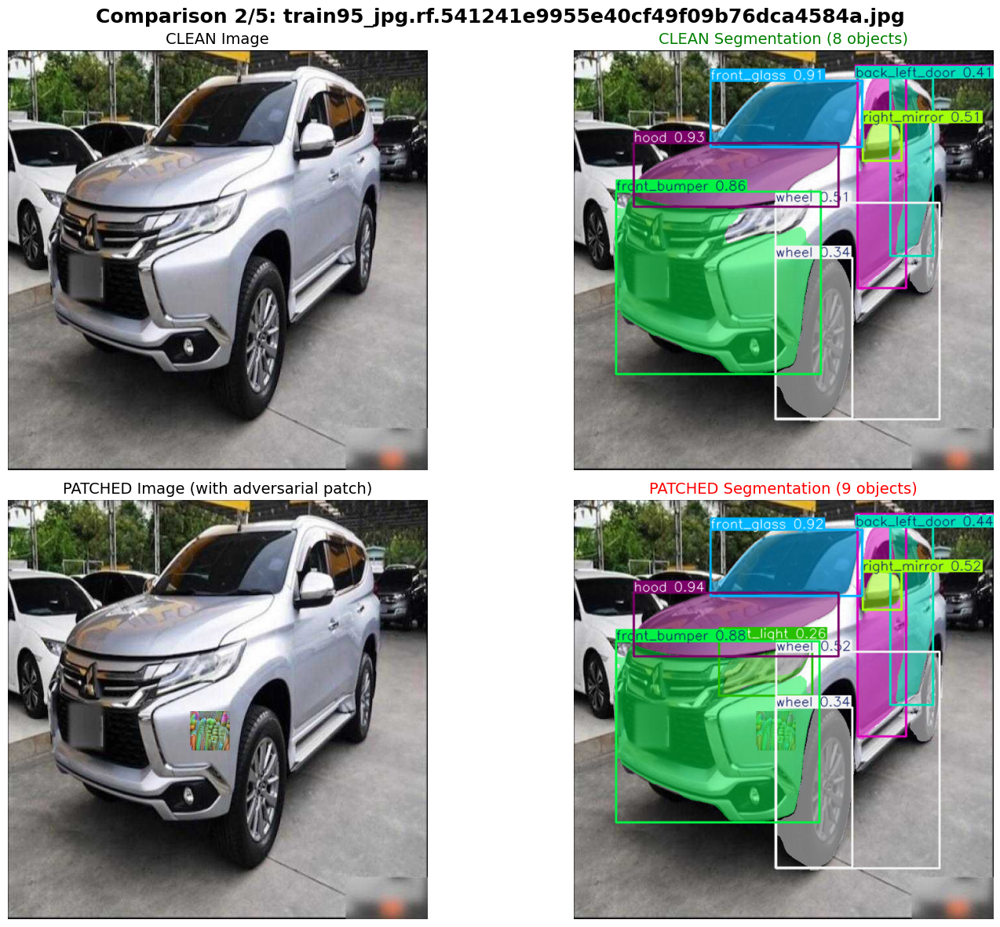


Image: train95_jpg.rf.541241e9955e40cf49f09b76dca4584a.jpg
  Clean detected:   8 objects
  Patched detected: 9 objects
  Difference:       -1 (no effect)



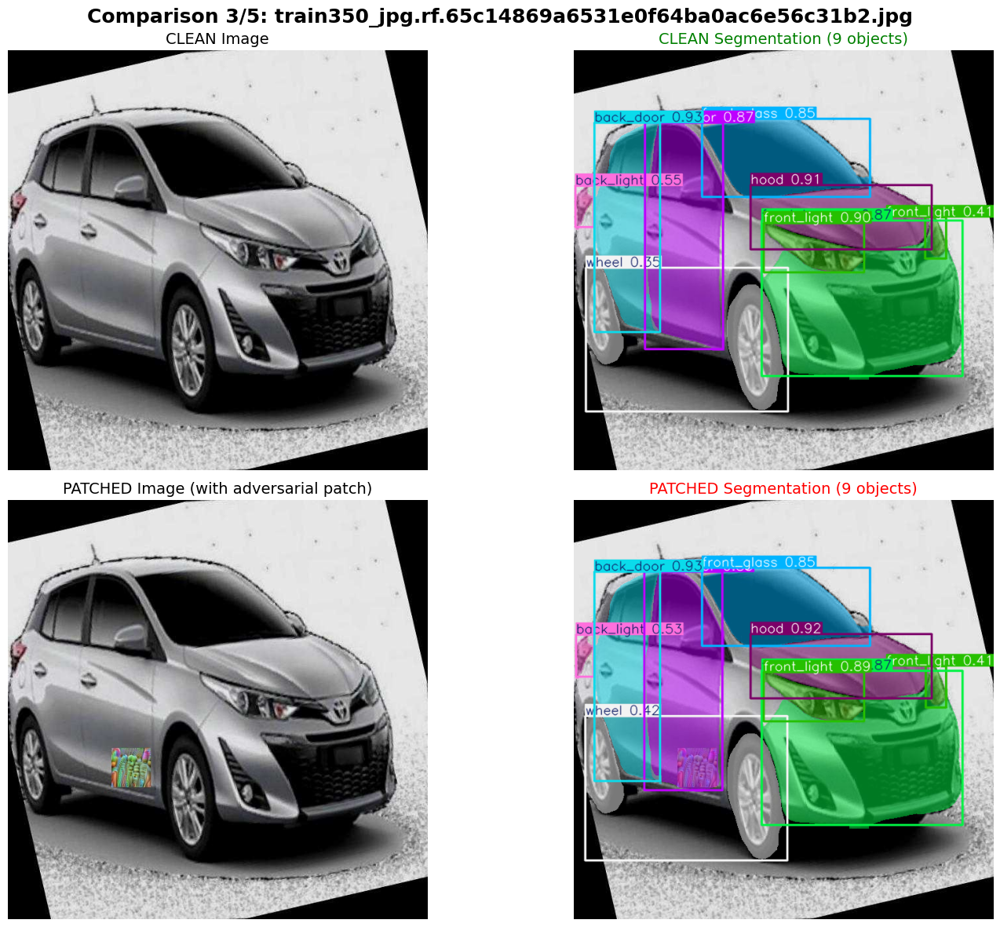


Image: train350_jpg.rf.65c14869a6531e0f64ba0ac6e56c31b2.jpg
  Clean detected:   9 objects
  Patched detected: 9 objects
  Difference:       0 (no effect)



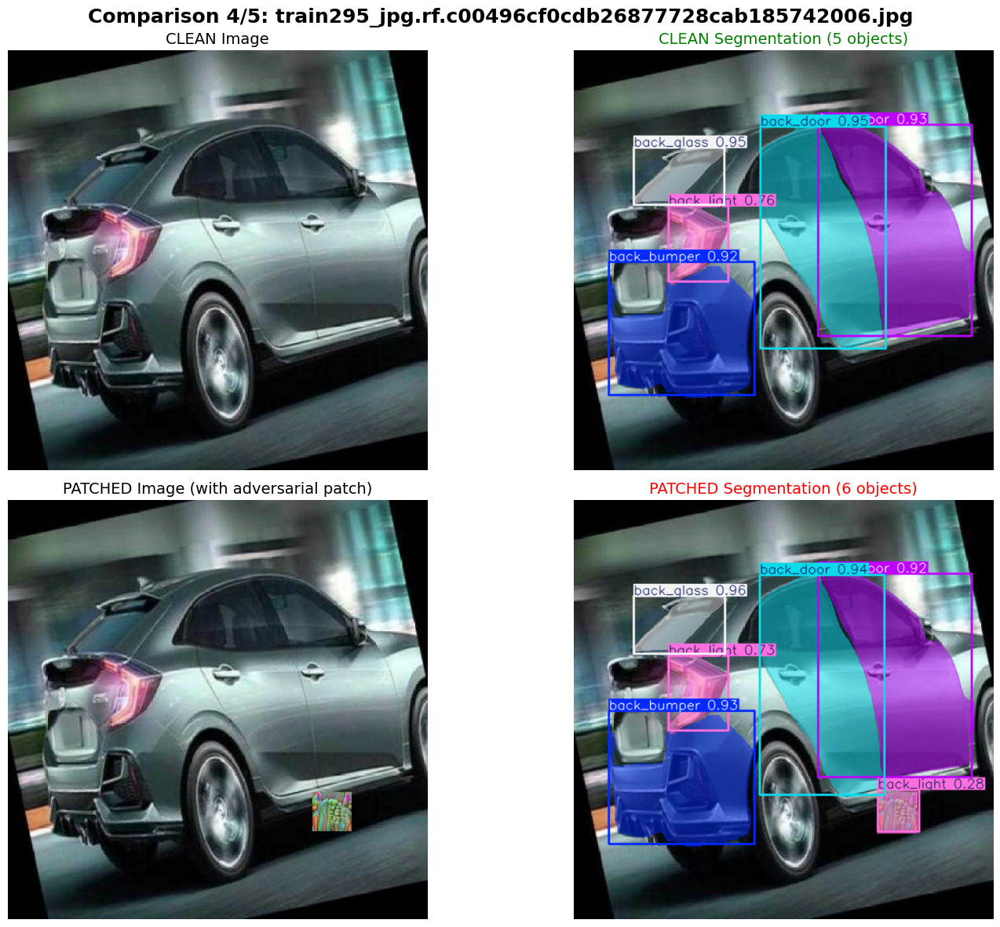


Image: train295_jpg.rf.c00496cf0cdb26877728cab185742006.jpg
  Clean detected:   5 objects
  Patched detected: 6 objects
  Difference:       -1 (no effect)



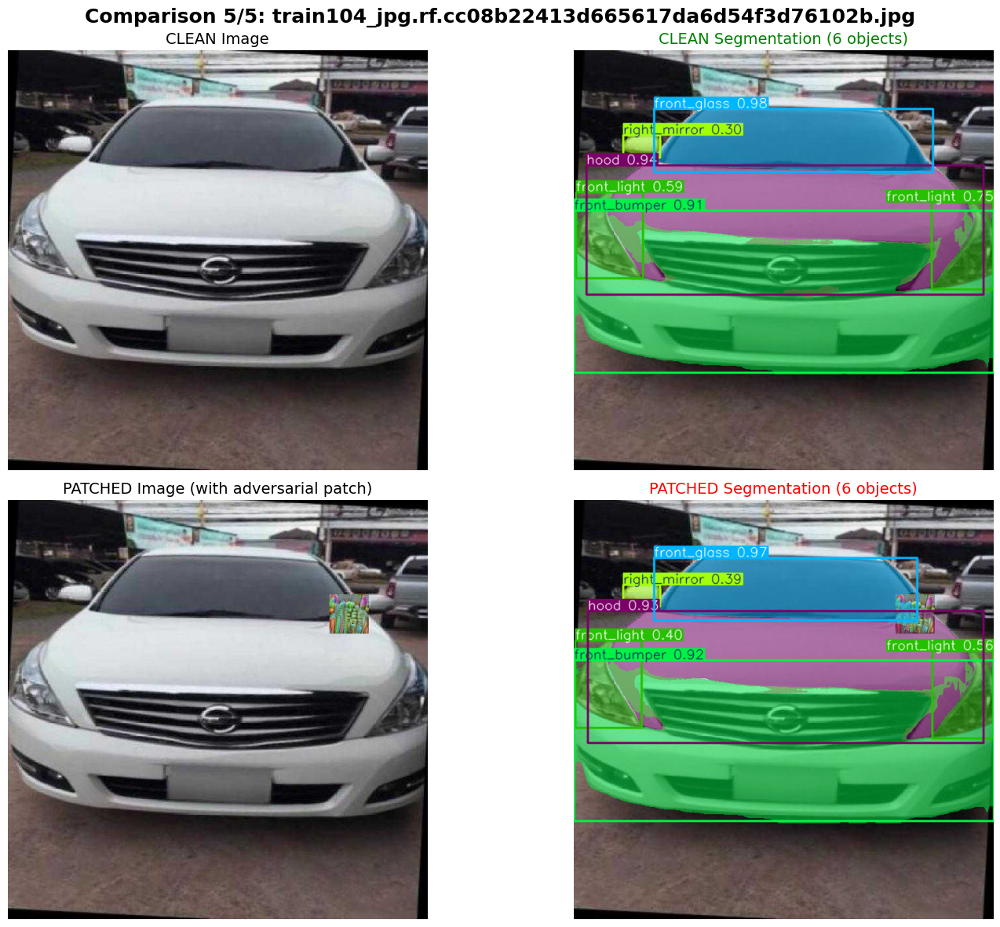


Image: train104_jpg.rf.cc08b22413d665617da6d54f3d76102b.jpg
  Clean detected:   6 objects
  Patched detected: 6 objects
  Difference:       0 (no effect)



In [31]:
# CELL NEW 4 (FIXED): Display side-by-side comparison with IPython display
import matplotlib.pyplot as plt
from IPython.display import display, Image as IPImage
import io

# Enable inline plotting
%matplotlib inline

for idx, data in enumerate(results_data):
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f"Comparison {idx+1}/5: {data['name']}", fontsize=18, fontweight='bold')
    
    # Top row: Clean
    axes[0, 0].imshow(data['clean_img'])
    axes[0, 0].set_title(f"CLEAN Image", fontsize=14)
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(data['clean_seg'])
    axes[0, 1].set_title(f"CLEAN Segmentation ({data['clean_masks']} objects)", fontsize=14, color='green')
    axes[0, 1].axis('off')
    
    # Bottom row: Patched
    axes[1, 0].imshow(data['patched_img'])
    axes[1, 0].set_title(f"PATCHED Image (with adversarial patch)", fontsize=14)
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(data['patched_seg'])
    axes[1, 1].set_title(f"PATCHED Segmentation ({data['patched_masks']} objects)", fontsize=14, color='red')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    
    # Force display in notebook
    display(fig)
    plt.close(fig)  # Close to avoid duplicate display
    
    # Print statistics
    diff = data['clean_masks'] - data['patched_masks']
    print(f"\n{'='*70}")
    print(f"Image: {data['name']}")
    print(f"  Clean detected:   {data['clean_masks']} objects")
    print(f"  Patched detected: {data['patched_masks']} objects")
    print(f"  Difference:       {diff} {'(patch reduced detections!)' if diff > 0 else '(no effect)'}")
    print(f"{'='*70}\n")

In [32]:
# CELL NEW 5: Summary statistics
import pandas as pd

summary_df = pd.DataFrame({
    'Image': [d['name'] for d in results_data],
    'Clean_Objects': [d['clean_masks'] for d in results_data],
    'Patched_Objects': [d['patched_masks'] for d in results_data],
    'Difference': [d['clean_masks'] - d['patched_masks'] for d in results_data]
})

print("\n📊 SUMMARY OF ADVERSARIAL PATCH EFFECT ON SEGMENTATION")
print("="*70)
print(summary_df.to_string(index=False))
print("="*70)

avg_clean = summary_df['Clean_Objects'].mean()
avg_patched = summary_df['Patched_Objects'].mean()
avg_diff = summary_df['Difference'].mean()

print(f"\n🔢 Average objects detected (clean):   {avg_clean:.2f}")
print(f"🔢 Average objects detected (patched): {avg_patched:.2f}")
print(f"🔻 Average reduction:                  {avg_diff:.2f} objects ({(avg_diff/avg_clean*100):.1f}%)")

if avg_diff > 0:
    print("\n✅ SUCCESS! The adversarial patch reduces segmentation detections!")
else:
    print("\n⚠️  The patch has minimal effect. Consider retraining with stronger parameters.")


📊 SUMMARY OF ADVERSARIAL PATCH EFFECT ON SEGMENTATION
                                               Image  Clean_Objects  Patched_Objects  Difference
    te16_jpg.rf.efdcd8e1bbb4fae0eec8cd39b9b75838.jpg             14               12           2
 train95_jpg.rf.541241e9955e40cf49f09b76dca4584a.jpg              8                9          -1
train350_jpg.rf.65c14869a6531e0f64ba0ac6e56c31b2.jpg              9                9           0
train295_jpg.rf.c00496cf0cdb26877728cab185742006.jpg              5                6          -1
train104_jpg.rf.cc08b22413d665617da6d54f3d76102b.jpg              6                6           0

🔢 Average objects detected (clean):   8.40
🔢 Average objects detected (patched): 8.40
🔻 Average reduction:                  0.00 objects (0.0%)

⚠️  The patch has minimal effect. Consider retraining with stronger parameters.


---

# YOLOv8 Segmentation Training and Comparison

Now we train YOLOv8 (the model used for adversarial patch generation) for **segmentation** and compare its performance on patched vs clean images.

**Goal:** See if the adversarial patch trained against YOLOv8 detection also affects YOLOv8 segmentation.

In [33]:
# CELL YOLO8-1: Train YOLOv8 for segmentation
from ultralytics import YOLO
import torch

# Clear cache
torch.cuda.empty_cache()

# Load YOLOv8n-seg (nano segmentation model)
model_yolo8 = YOLO("yolov8n-seg.pt")



In [34]:
print("🚀 Training YOLOv8n-seg on carparts-seg dataset...")
results_yolo8 = model_yolo8.train(
    data="carparts-seg.yaml",
    epochs=10,
    imgsz=640,
    batch=8,
    workers=4,
    device=0,
    patience=50,
    pretrained=True,
    verbose=True,
    exist_ok=True,
    project="runs/segment",
    name="train_yolo8_seg",
    save=True,
    save_period=5,
    plots=True,
    amp=True,
    cache=False,
)


🚀 Training YOLOv8n-seg on carparts-seg dataset...
New https://pypi.org/project/ultralytics/8.3.229 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.226 🚀 Python-3.10.14 torch-2.3.0 CUDA:0 (NVIDIA A40, 45488MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=carparts-seg.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=tr

In [35]:

yolo8_best_pt = str(results_yolo8.save_dir / "weights" / "best.pt")
print(f"\n✅ YOLOv8 segmentation training complete!")
print(f"   Best model: {yolo8_best_pt}")


✅ YOLOv8 segmentation training complete!
   Best model: /nvme/mvnshpra/apptainer_env/runs/segment/train_yolo8_seg/weights/best.pt


In [45]:
# CELL YOLO8-2
from pathlib import Path
import pandas as pd

STATS_CSV = Path("outputs/patch_effect_stats_full.csv")

if STATS_CSV.exists():
    df_detection = pd.read_csv(STATS_CSV)
    
    df_detection["drop_%"] = (1 - (df_detection["cars_patched"] / (df_detection["cars_clean"] + 1e-6))) * 100
    
    moderate_effect = df_detection[(df_detection["drop_%"] >= 40) & (df_detection["drop_%"] < 90)].sort_values("drop_%", ascending=False)
    complete_failure = df_detection[(df_detection["cars_patched"] == 0) & (df_detection["cars_clean"] > 0)].sort_values("cars_clean", ascending=False)
    
    print(f"✅ Found {len(moderate_effect)} images with 40-90% drop (moderate effect)")
    print(f"✅ Found {len(complete_failure)} images with 100% drop (complete failure)")
    
    target_images = []
    target_images.extend(moderate_effect.head(3)['image'].tolist())
    target_images.extend(complete_failure.head(2)['image'].tolist())
    
    print(f"\n🎯 Selected {len(target_images)} images:")
    for img in target_images:
        img_row = df_detection[df_detection['image'] == img].iloc[0]
        print(f"  - {img}: {img_row['cars_clean']} cars → {img_row['cars_patched']} cars (drop: {img_row['drop_%']:.1f}%)")
else:
    print(f"❌ Detection stats not found at {STATS_CSV}")
    target_images = []

✅ Found 1 images with 40-90% drop (moderate effect)
✅ Found 157 images with 100% drop (complete failure)

🎯 Selected 3 images:
  - train231_jpg.rf.ef62a7d9414eb75db8b59436e85d329f.jpg: 2 cars → 1 cars (drop: 50.0%)
  - train82_jpg.rf.f0999e1918912ce2d0d83bf980e16cdb.jpg: 2 cars → 0 cars (drop: 100.0%)
  - car32_jpg.rf.1ee7dbf800e81a091b898a7d333df82c.jpg: 1 cars → 0 cars (drop: 100.0%)


In [46]:
# CELL YOLO8-3: Run YOLOv8 detection AND segmentation 
from ultralytics import YOLO
import cv2
from pathlib import Path
import numpy as np

if len(target_images) > 0:
    yolo8_det_model = YOLO("yolov8n.pt")
    print("✅ YOLOv8n detection model loaded")
    
    yolo8_seg_model = YOLO(yolo8_best_pt)
    print("✅ YOLOv8n-seg segmentation model loaded")
    
    CLEAN_DATASET = Path("datasets/carparts-seg/images")
    PATCHED_DATASET = Path("outputs/patched_dataset")
    
    yolo8_results = []
    
    for img_name in target_images:
        print(f"\n🔍 Processing: {img_name}")
        
        clean_path = None
        for split in ['train', 'val', 'test']:
            candidate = CLEAN_DATASET / split / img_name
            if candidate.exists():
                clean_path = candidate
                break
        
        patched_path = PATCHED_DATASET / img_name
        
        if clean_path and patched_path.exists():
            clean_det_result = yolo8_det_model.predict(
                source=str(clean_path),
                conf=0.25,
                iou=0.45,
                verbose=False,
                save=False,
                classes=[2]
            )[0]
            
            clean_seg_result = yolo8_seg_model.predict(
                source=str(clean_path),
                conf=0.25,
                iou=0.45,
                verbose=False,
                save=False
            )[0]
            
            patched_det_result = yolo8_det_model.predict(
                source=str(patched_path),
                conf=0.25,
                iou=0.45,
                verbose=False,
                save=False,
                classes=[2]
            )[0]
            
            patched_seg_result = yolo8_seg_model.predict(
                source=str(patched_path),
                conf=0.25,
                iou=0.45,
                verbose=False,
                save=False
            )[0]
            
            det_stats = df_detection[df_detection['image'] == img_name].iloc[0]
            
            yolo8_results.append({
                'name': img_name,
                'clean_img': cv2.cvtColor(cv2.imread(str(clean_path)), cv2.COLOR_BGR2RGB),
                'patched_img': cv2.cvtColor(cv2.imread(str(patched_path)), cv2.COLOR_BGR2RGB),
                'clean_det': cv2.cvtColor(clean_det_result.plot(), cv2.COLOR_BGR2RGB),
                'clean_seg': cv2.cvtColor(clean_seg_result.plot(), cv2.COLOR_BGR2RGB),
                'patched_det': cv2.cvtColor(patched_det_result.plot(), cv2.COLOR_BGR2RGB),
                'patched_seg': cv2.cvtColor(patched_seg_result.plot(), cv2.COLOR_BGR2RGB),
                'clean_det_boxes': len(clean_det_result.boxes),
                'patched_det_boxes': len(patched_det_result.boxes),
                'clean_seg_masks': len(clean_seg_result.masks.data) if clean_seg_result.masks is not None else 0,
                'patched_seg_masks': len(patched_seg_result.masks.data) if patched_seg_result.masks is not None else 0,
                'detection_drop_%': det_stats['drop_%']
            })
            
            print(f"  Detection (CARS ONLY) - Clean: {yolo8_results[-1]['clean_det_boxes']} | Patched: {yolo8_results[-1]['patched_det_boxes']} (drop: {det_stats['drop_%']:.1f}%)")
            print(f"  Segmentation (ALL) - Clean: {yolo8_results[-1]['clean_seg_masks']} | Patched: {yolo8_results[-1]['patched_seg_masks']}")
        else:
            print(f"  ⚠️  Image not found, skipping")
    
    print(f"\n✅ YOLOv8 detection + segmentation complete on {len(yolo8_results)} images")
else:
    print("⚠️  No target images to process")

✅ YOLOv8n detection model loaded
✅ YOLOv8n-seg segmentation model loaded

🔍 Processing: train231_jpg.rf.ef62a7d9414eb75db8b59436e85d329f.jpg
  Detection (CARS ONLY) - Clean: 1 | Patched: 1 (drop: 50.0%)
  Segmentation (ALL) - Clean: 7 | Patched: 7

🔍 Processing: train82_jpg.rf.f0999e1918912ce2d0d83bf980e16cdb.jpg
  Detection (CARS ONLY) - Clean: 1 | Patched: 0 (drop: 100.0%)
  Segmentation (ALL) - Clean: 5 | Patched: 5

🔍 Processing: car32_jpg.rf.1ee7dbf800e81a091b898a7d333df82c.jpg
  Detection (CARS ONLY) - Clean: 2 | Patched: 1 (drop: 100.0%)
  Segmentation (ALL) - Clean: 4 | Patched: 5

✅ YOLOv8 detection + segmentation complete on 3 images


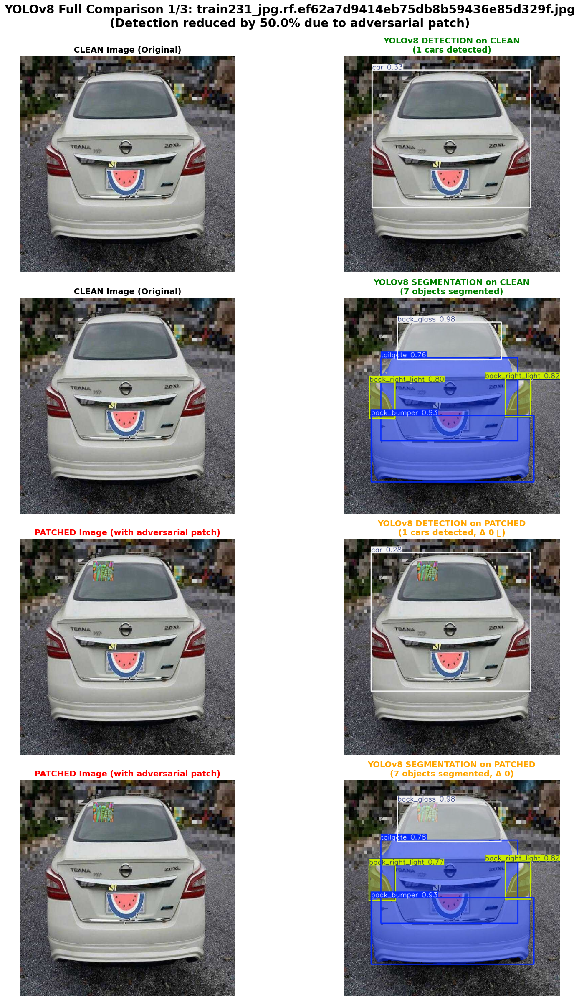


Image: train231_jpg.rf.ef62a7d9414eb75db8b59436e85d329f.jpg
📊 YOLOv8 DETECTION (adversarial patch attack):
   Clean:   1 cars detected
   Patched: 1 cars detected
   Drop:    50.0% ❌ ATTACK WORKED!

🎨 YOLOv8 SEGMENTATION (does attack transfer?):
   Clean:   7 objects segmented
   Patched: 7 objects segmented
   Diff:    0 objects
   ⚠️  NO transfer - segmentation unaffected (0% reduction)



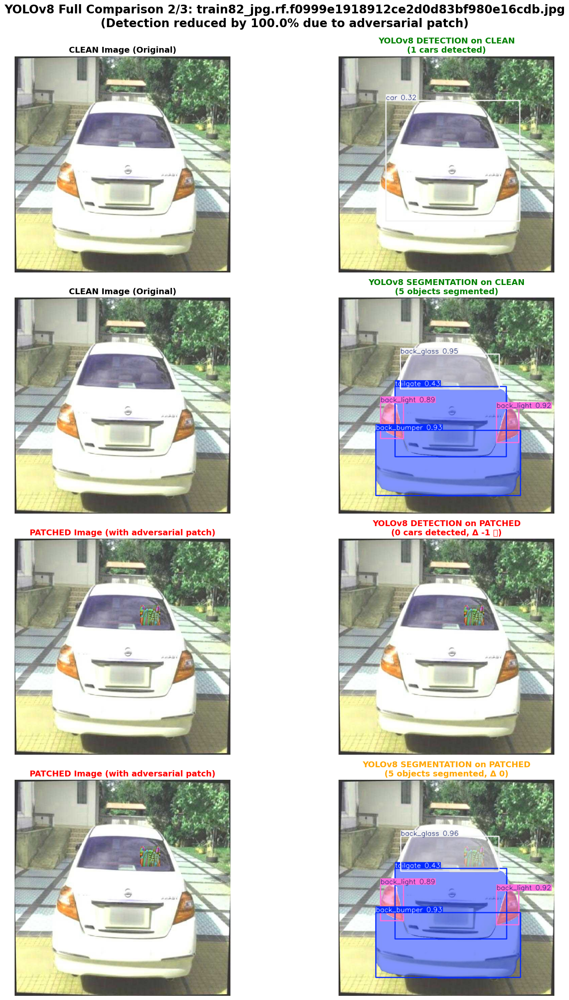


Image: train82_jpg.rf.f0999e1918912ce2d0d83bf980e16cdb.jpg
📊 YOLOv8 DETECTION (adversarial patch attack):
   Clean:   1 cars detected
   Patched: 0 cars detected
   Drop:    100.0% ❌ ATTACK WORKED!

🎨 YOLOv8 SEGMENTATION (does attack transfer?):
   Clean:   5 objects segmented
   Patched: 5 objects segmented
   Diff:    0 objects
   ⚠️  NO transfer - segmentation unaffected (0% reduction)



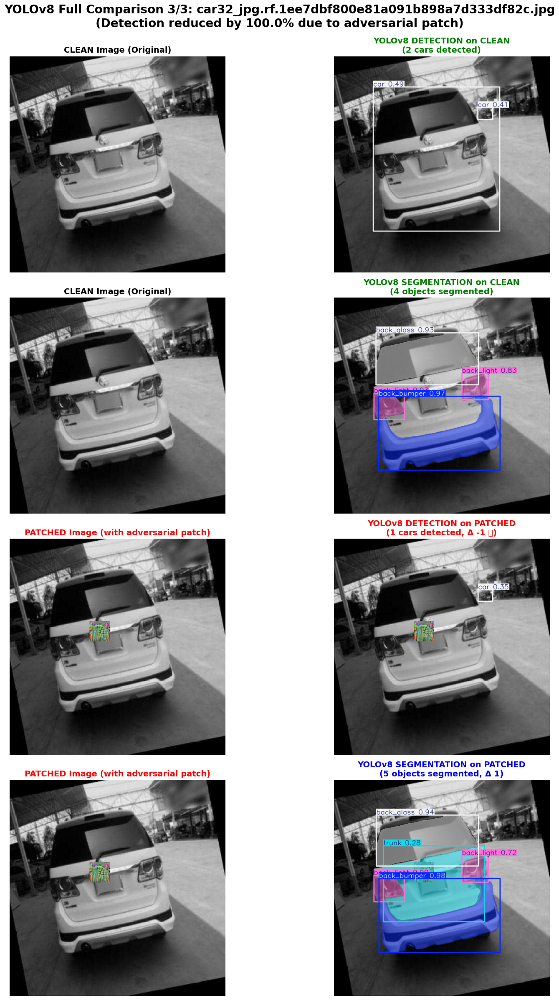


Image: car32_jpg.rf.1ee7dbf800e81a091b898a7d333df82c.jpg
📊 YOLOv8 DETECTION (adversarial patch attack):
   Clean:   2 cars detected
   Patched: 1 cars detected
   Drop:    100.0% ❌ ATTACK WORKED!

🎨 YOLOv8 SEGMENTATION (does attack transfer?):
   Clean:   4 objects segmented
   Patched: 5 objects segmented
   Diff:    -1 objects
   ❓ Segmentation detected MORE on patched image (unusual)



In [47]:
# CELL YOLO8-4: Display 4-row comparison for YOLOv8 detection AND segmentation
import matplotlib.pyplot as plt
from IPython.display import display

%matplotlib inline

if len(yolo8_results) > 0:
    for idx, data in enumerate(yolo8_results):
        fig, axes = plt.subplots(4, 2, figsize=(18, 24))
        fig.suptitle(
            f"YOLOv8 Full Comparison {idx+1}/{len(yolo8_results)}: {data['name']}\n" +
            f"(Detection reduced by {data['detection_drop_%']:.1f}% due to adversarial patch)",
            fontsize=20, fontweight='bold', y=0.995
        )
        
        # ROW 1: CLEAN IMAGE + YOLO8 DETECTION
        axes[0, 0].imshow(data['clean_img'])
        axes[0, 0].set_title("CLEAN Image (Original)", fontsize=14, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(data['clean_det'])
        axes[0, 1].set_title(
            f"YOLOv8 DETECTION on CLEAN\n({data['clean_det_boxes']} cars detected)",
            fontsize=14, color='green', fontweight='bold'
        )
        axes[0, 1].axis('off')
        
        # ROW 2: CLEAN IMAGE + YOLO8 SEGMENTATION
        axes[1, 0].imshow(data['clean_img'])
        axes[1, 0].set_title("CLEAN Image (Original)", fontsize=14, fontweight='bold')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(data['clean_seg'])
        axes[1, 1].set_title(
            f"YOLOv8 SEGMENTATION on CLEAN\n({data['clean_seg_masks']} objects segmented)",
            fontsize=14, color='green', fontweight='bold'
        )
        axes[1, 1].axis('off')
        
        # ROW 3: PATCHED IMAGE + YOLO8 DETECTION (SHOWS ATTACK EFFECT)
        axes[2, 0].imshow(data['patched_img'])
        axes[2, 0].set_title("PATCHED Image (with adversarial patch)", fontsize=14, fontweight='bold', color='red')
        axes[2, 0].axis('off')
        
        det_diff = data['clean_det_boxes'] - data['patched_det_boxes']
        det_color = 'red' if det_diff > 0 else 'orange'
        
        axes[2, 1].imshow(data['patched_det'])
        axes[2, 1].set_title(
            f"YOLOv8 DETECTION on PATCHED\n({data['patched_det_boxes']} cars detected, Δ {-det_diff} ❌)",
            fontsize=14, color=det_color, fontweight='bold'
        )
        axes[2, 1].axis('off')
        
        # ROW 4: PATCHED IMAGE + YOLO8 SEGMENTATION (DOES ATTACK TRANSFER?)
        axes[3, 0].imshow(data['patched_img'])
        axes[3, 0].set_title("PATCHED Image (with adversarial patch)", fontsize=14, fontweight='bold', color='red')
        axes[3, 0].axis('off')
        
        seg_diff = data['clean_seg_masks'] - data['patched_seg_masks']
        seg_color = 'red' if seg_diff > 0 else 'orange' if seg_diff == 0 else 'blue'
        
        axes[3, 1].imshow(data['patched_seg'])
        axes[3, 1].set_title(
            f"YOLOv8 SEGMENTATION on PATCHED\n({data['patched_seg_masks']} objects segmented, Δ {-seg_diff})",
            fontsize=14, color=seg_color, fontweight='bold'
        )
        axes[3, 1].axis('off')
        
        plt.tight_layout()
        display(fig)
        plt.close(fig)
        
        # Print detailed statistics
        print(f"\n{'='*90}")
        print(f"Image: {data['name']}")
        print(f"{'='*90}")
        print(f"📊 YOLOv8 DETECTION (adversarial patch attack):")
        print(f"   Clean:   {data['clean_det_boxes']} cars detected")
        print(f"   Patched: {data['patched_det_boxes']} cars detected")
        print(f"   Drop:    {data['detection_drop_%']:.1f}% ❌ ATTACK WORKED!")
        
        print(f"\n🎨 YOLOv8 SEGMENTATION (does attack transfer?):")
        print(f"   Clean:   {data['clean_seg_masks']} objects segmented")
        print(f"   Patched: {data['patched_seg_masks']} objects segmented")
        print(f"   Diff:    {seg_diff} objects")
        
        if seg_diff > 0:
            seg_drop_pct = (seg_diff / max(data['clean_seg_masks'], 1)) * 100
            print(f"   ✅ YES! Attack transfers to segmentation ({seg_drop_pct:.1f}% reduction)")
        elif seg_diff == 0:
            print(f"   ⚠️  NO transfer - segmentation unaffected (0% reduction)")
        else:
            print(f"   ❓ Segmentation detected MORE on patched image (unusual)")
        
        print(f"{'='*90}\n")
else:
    print("⚠️  No results to display")